# Object Detection for Wildlife Conservation
## Detecting Waterfowl in UAV Thermal Imagery

**Student:** Prahas Hegde, Rohan Sanjay Patil, Vidya Padmanabha
**Course:** Computer Vision
**Date:** 17-11-25

---

## Table of Contents
1. [Introduction & Problem Statement](#introduction)
2. [Dataset Overview](#dataset)
3. [**Part 1: Thermal-Only Detection (Baseline)**](#part1)
   - 3.1 [Data Preparation for Thermal](#thermal-prep)
   - 3.2 [Training Thermal Model](#thermal-train)
   - 3.3 [Thermal Model Evaluation](#thermal-eval)
   - 3.4 [Thermal Model Analysis](#thermal-analysis)
4. [**Part 2: RGB-Thermal Fusion (Hypothetical Improvement)**](#part2)
   - 4.1 [Motivation for Fusion](#fusion-motivation)
   - 4.2 [Fusion Data Preparation](#fusion-prep)
   - 4.3 [Training Fusion Model](#fusion-train)
   - 4.4 [Fusion Model Evaluation](#fusion-eval)
5. [Comparative Analysis](#comparison)
6. [Visualization & Error Analysis](#visualization)
7. [Discussion & Conclusion](#conclusion)

---
## 1. Introduction & Problem Statement <a id="introduction"></a>

### Background
Wildlife conservation increasingly relies on **Unmanned Aerial Vehicles (UAVs)** for non-invasive monitoring of animal populations. Traditional manual counting methods are:
- Time-consuming and labor-intensive
- Subject to human error
- Limited in spatial coverage
- Potentially disruptive to wildlife

### Problem Statement
**Goal**: Develop an automated system to detect waterfowl in UAV aerial imagery using deep learning.

### Why Thermal Imagery?
Thermal cameras detect infrared radiation (heat), offering several advantages:
- 🌡️ **Temperature contrast**: Birds (warm-blooded) stand out against cooler backgrounds
- 🌙 **Day/night operation**: Independent of natural lighting
- 🌫️ **Weather resistant**: Works in fog, overcast, low visibility
- 🎨 **Camouflage irrelevant**: Heat signatures visible regardless of plumage color

### Assignment Approach
We will follow a **systematic, iterative approach**:

1. **Baseline**: Thermal-only detection using YOLOv5
2. **Identify limitations** through evaluation
3. **Propose improvement**: RGB-Thermal fusion
4. **Compare results** and analyze trade-offs

### Object Detection Method: YOLOv8
**YOLO (You Only Look Once)** is a state-of-the-art real-time object detector:
- Single-stage detector (fast inference)
- Pre-trained on COCO dataset
- Multiple variants (nano, small, medium, large)
- Suitable for edge deployment on UAVs

In [1]:
# Import necessary libraries
import os
import shutil
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import glob
import random
from pathlib import Path

# For reproducibility
np.random.seed(42)
random.seed(42)

# Display settings
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 11

print("✅ Libraries imported successfully")
print(f"OpenCV version: {cv2.__version__}")
print(f"NumPy version: {np.__version__}")

✅ Libraries imported successfully
OpenCV version: 4.12.0
NumPy version: 2.2.4


---
## 2. Dataset Overview <a id="dataset"></a>

### UAV-derived Waterfowl Thermal Imagery Dataset

**Source**: Mendeley Data Repository 
**Link**: https://data.mendeley.com/datasets/46k66mz9sz/2

**Dataset Components**:
1. **Thermal Images** (.tif format)
   - Resolution: 512 × 640 pixels
   - Grayscale (single channel)
   - Primary data source for detection

2. **RGB Images** (.jpg format)
   - Resolution: 3000 × 4000 pixels
   - Standard visible spectrum
   - Companion data (optional for fusion)

3. **Annotations** (CSV format)
   - Bounding box coordinates in thermal image space
   - Format: (x, y, width, height)
   - All boxes are 7×7 pixels

In [2]:
# Define paths to dataset
POSITIVE_IMG_DIR = '01_Positive_Image'     # Thermal images with waterfowl
NEGATIVE_IMG_DIR = '03_Negative_Images'    # Thermal images without waterfowl
RGB_DIR = '01_RGB_Images'                  # RGB companion images
ANNOTATION_CSV = 'Bounding Box Label.csv'  # Annotations

# Verify paths exist
for path in [POSITIVE_IMG_DIR, NEGATIVE_IMG_DIR, RGB_DIR, ANNOTATION_CSV]:
    if os.path.exists(path):
        print(f"✅ Found: {path}")
    else:
        print(f"❌ Missing: {path}")

✅ Found: 01_Positive_Image
✅ Found: 03_Negative_Images
✅ Found: 01_RGB_Images
✅ Found: Bounding Box Label.csv


### Load and Explore Annotations

In [3]:
# Load annotations
df_annotations = pd.read_csv(ANNOTATION_CSV)

print("📊 Annotation Statistics:")
print(f"Total bounding boxes: {len(df_annotations):,}")
print(f"Unique images with waterfowl: {df_annotations['imageFilename'].nunique()}")
print(f"\nAverage birds per image: {len(df_annotations) / df_annotations['imageFilename'].nunique():.1f}")

print("\n📦 Bounding Box Properties:")
print(f"Width: {df_annotations['width'].unique()}")
print(f"Height: {df_annotations['height'].unique()}")
print(f"\n⚠️ Note: All boxes are {df_annotations['width'].iloc[0]}×{df_annotations['height'].iloc[0]} pixels - very small objects!")

print("\n📄 Sample Annotations:")
display(df_annotations.head(10))

📊 Annotation Statistics:
Total bounding boxes: 8,975
Unique images with waterfowl: 355

Average birds per image: 25.3

📦 Bounding Box Properties:
Width: [7]
Height: [7]

⚠️ Note: All boxes are 7×7 pixels - very small objects!

📄 Sample Annotations:


,imageFilename,x(column),y(row),width,height
0,20180322_101536_979_R.tif,127,11,7,7
1,20180322_101536_979_R.tif,174,32,7,7
2,20180322_101536_979_R.tif,178,19,7,7
3,20180322_101536_979_R.tif,199,31,7,7
4,20180322_101536_979_R.tif,223,51,7,7
5,20180322_101536_979_R.tif,228,48,7,7
6,20180322_101536_979_R.tif,236,42,7,7
7,20180322_101536_979_R.tif,291,46,7,7
8,20180322_101536_979_R.tif,310,16,7,7
9,20180322_101536_979_R.tif,301,42,7,7


### Dataset Size Analysis

In [4]:
# Count images
pos_thermal_images = [f for f in os.listdir(POSITIVE_IMG_DIR) if f.endswith('.tif')]
neg_thermal_images = [f for f in os.listdir(NEGATIVE_IMG_DIR) if f.endswith('.tif')]
rgb_images = [f for f in os.listdir(RGB_DIR) if f.endswith(('.jpg', '.jpeg', '.png'))]

print("📁 Dataset Composition:")
print(f"Positive thermal images: {len(pos_thermal_images)}")
print(f"Negative thermal images: {len(neg_thermal_images)}")
print(f"Total thermal images: {len(pos_thermal_images) + len(neg_thermal_images)}")
print(f"RGB images: {len(rgb_images)}")

# Class balance
pos_ratio = len(pos_thermal_images) / (len(pos_thermal_images) + len(neg_thermal_images))
print(f"\n⚖️ Class balance: {pos_ratio:.1%} positive, {1-pos_ratio:.1%} negative")

📁 Dataset Composition:
Positive thermal images: 355
Negative thermal images: 187
Total thermal images: 542
RGB images: 663

⚖️ Class balance: 65.5% positive, 34.5% negative


### Visualize Sample Images

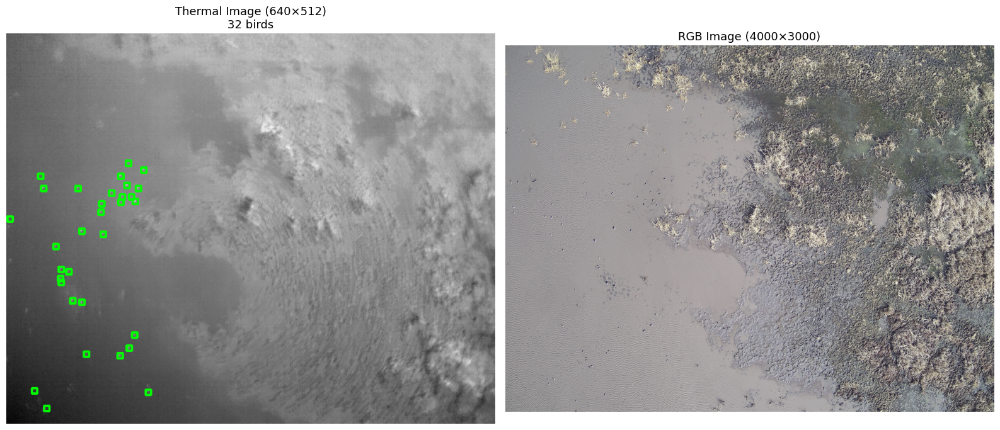


💡 Observations:
    • Thermal resolution: 640×512 pixels
    • RGB resolution: 4000×3000 pixels
    • Resolution ratio: ~6.2× width, ~5.9× height
    • Bounding boxes: 7×7 pixels in thermal = ~44×41 pixels if scaled to RGB


In [5]:
# Load and display sample thermal and RGB images
sample_thermal_file = pos_thermal_images[0]
sample_base_name = os.path.splitext(sample_thermal_file)[0]
sample_rgb_file = sample_base_name + '_visual.jpg'

# Load images
thermal_img = cv2.imread(os.path.join(POSITIVE_IMG_DIR, sample_thermal_file), cv2.IMREAD_GRAYSCALE)
rgb_img = cv2.imread(os.path.join(RGB_DIR, sample_rgb_file))
rgb_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)

# Get annotations for this image
sample_annotations = df_annotations[df_annotations['imageFilename'] == sample_thermal_file]

# Display
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Thermal image with boxes
thermal_display = cv2.cvtColor(thermal_img, cv2.COLOR_GRAY2RGB)
for _, row in sample_annotations.iterrows():
    x, y, w, h = int(row['x(column)']), int(row['y(row)']), int(row['width']), int(row['height'])
    cv2.rectangle(thermal_display, (x, y), (x+w, y+h), (0, 255, 0), 2)

axes[0].imshow(thermal_display)
axes[0].set_title(f'Thermal Image ({thermal_img.shape[1]}×{thermal_img.shape[0]})\n{len(sample_annotations)} birds', fontsize=13)
axes[0].axis('off')

# RGB image
axes[1].imshow(rgb_img)
axes[1].set_title(f'RGB Image ({rgb_img.shape[1]}×{rgb_img.shape[0]})', fontsize=13)
axes[1].axis('off')

plt.tight_layout()
plt.show()

print(f"\n💡 Observations:")
print(f"    • Thermal resolution: {thermal_img.shape[1]}×{thermal_img.shape[0]} pixels")
print(f"    • RGB resolution: {rgb_img.shape[1]}×{rgb_img.shape[0]} pixels")
print(f"    • Resolution ratio: ~{rgb_img.shape[1]/thermal_img.shape[1]:.1f}× width, ~{rgb_img.shape[0]/thermal_img.shape[0]:.1f}× height")
print(f"    • Bounding boxes: 7×7 pixels in thermal = ~44×41 pixels if scaled to RGB")

---
---
# PART 1: THERMAL-ONLY DETECTION (BASELINE)
---
---

## 3. Part 1: Thermal-Only Detection <a id="part1"></a>

### Baseline Approach Rationale

We start with **thermal-only detection** as our baseline because:

1. ✅ **Assignment requirement**: "Use thermal imagery as the primary input"
2. ✅ **Thermal advantages**: Natural contrast between warm birds and cool water/vegetation
3. ✅ **Simpler pipeline**: Single modality is easier to implement and debug
4. ✅ **Establishes baseline**: Provides performance benchmark for comparison

### Expected Challenges
- **Low resolution**: 512×640 pixels
- **Small objects**: 7×7 pixel bounding boxes
- **Limited visual features**: Single channel (grayscale)
- **No texture information**: Only temperature differences

Let's see how well we can do with thermal data alone!

---
### 3.1 Data Preparation for Thermal-Only Model <a id="thermal-prep"></a>

In [6]:
# Configuration for thermal-only dataset
THERMAL_YOLO_DIR = 'yolo_dataset_thermal_only'

# Split ratios
TRAIN_RATIO = 0.70
VAL_RATIO = 0.20
TEST_RATIO = 0.10

print("⚙️ Thermal-Only Configuration:")
print(f"Output directory: {THERMAL_YOLO_DIR}")
print(f"Split ratios: {TRAIN_RATIO:.0%} train / {VAL_RATIO:.0%} val / {TEST_RATIO:.0%} test")

⚙️ Thermal-Only Configuration:
Output directory: yolo_dataset_thermal_only
Split ratios: 70% train / 20% val / 10% test


#### Create YOLO Directory Structure

In [7]:
# Create YOLO-format directories
for split in ['train', 'val', 'test']:
    os.makedirs(os.path.join(THERMAL_YOLO_DIR, 'images', split), exist_ok=True)
    os.makedirs(os.path.join(THERMAL_YOLO_DIR, 'labels', split), exist_ok=True)

print("✅ Directory structure created:")
print(f"{THERMAL_YOLO_DIR}/")
print("├── images/")
print("│   ├── train/")
print("│   ├── val/")
print("│   └── test/")
print("└── labels/")
print("    ├── train/")
print("    ├── val/")
print("    └── test/")

✅ Directory structure created:
yolo_dataset_thermal_only/
├── images/
│   ├── train/
│   ├── val/
│   └── test/
└── labels/
    ├── train/
    ├── val/
    └── test/


#### Stratified Dataset Split

In [8]:
# Perform stratified split (maintain positive/negative ratio)
print("🔀 Performing stratified train/val/test split...\n")

# Split positive images
pos_train_val, pos_test = train_test_split(
    pos_thermal_images, 
    test_size=TEST_RATIO, 
    random_state=42
)
pos_train, pos_val = train_test_split(
    pos_train_val,
    test_size=VAL_RATIO / (TRAIN_RATIO + VAL_RATIO),
    random_state=42
)

# Split negative images
neg_train_val, neg_test = train_test_split(
    neg_thermal_images,
    test_size=TEST_RATIO,
    random_state=42
)
neg_train, neg_val = train_test_split(
    neg_train_val,
    test_size=VAL_RATIO / (TRAIN_RATIO + VAL_RATIO),
    random_state=42
)

# Combine splits
thermal_splits = {
    'train': pos_train + neg_train,
    'val': pos_val + neg_val,
    'test': pos_test + neg_test
}

print("📊 Dataset Split Summary:")
print(f"{'Split':<10} {'Total':<8} {'Positive':<10} {'Negative':<10} {'Pos %'}")
print("-" * 50)
for split_name, files in thermal_splits.items():
    n_pos = len([f for f in files if f in pos_thermal_images])
    n_neg = len([f for f in files if f in neg_thermal_images])
    pos_pct = n_pos / len(files) * 100
    print(f"{split_name:<10} {len(files):<8} {n_pos:<10} {n_neg:<10} {pos_pct:.1f}%")

print("\n✅ Split maintains class balance across train/val/test")

🔀 Performing stratified train/val/test split...

📊 Dataset Split Summary:
Split      Total    Positive   Negative   Pos %
--------------------------------------------------
train      378      248        130        65.6%
val        109      71         38         65.1%
test       55       36         19         65.5%

✅ Split maintains class balance across train/val/test


#### Process Thermal Images and Labels

In [9]:
def process_thermal_images(file_list, split_name, annotations_df):
    """
    Process thermal images for YOLO format:
    1. Convert thermal .tif to .jpg (3-channel for YOLO compatibility)
    2. Convert bounding boxes to YOLO format (normalized x_center, y_center, w, h)
    3. Save images and label files
    """
    img_output_dir = os.path.join(THERMAL_YOLO_DIR, 'images', split_name)
    label_output_dir = os.path.join(THERMAL_YOLO_DIR, 'labels', split_name)
    
    for filename in tqdm(file_list, desc=f"Processing {split_name}"):
        # Determine if positive (has birds) or negative
        is_positive = filename in pos_thermal_images
        
        # Load thermal image
        if is_positive:
            thermal_path = os.path.join(POSITIVE_IMG_DIR, filename)
        else:
            thermal_path = os.path.join(NEGATIVE_IMG_DIR, filename)
        
        img_thermal = cv2.imread(thermal_path, cv2.IMREAD_GRAYSCALE)
        
        if img_thermal is None:
            print(f"⚠️ Warning: Could not read {filename}")
            continue
        
        # Get image dimensions
        img_height, img_width = img_thermal.shape
        
        # Convert grayscale to 3-channel (YOLO expects 3-channel images)
        img_thermal_3ch = cv2.cvtColor(img_thermal, cv2.COLOR_GRAY2BGR)
        
        # Save image as .jpg
        output_filename = os.path.splitext(filename)[0] + '.jpg'
        output_img_path = os.path.join(img_output_dir, output_filename)
        cv2.imwrite(output_img_path, img_thermal_3ch)
        
        # Process labels
        label_filename = os.path.splitext(filename)[0] + '.txt'
        output_label_path = os.path.join(label_output_dir, label_filename)
        
        label_lines = []
        
        if is_positive:
            # Get bounding boxes for this image
            boxes_df = annotations_df[annotations_df['imageFilename'] == filename]
            
            for _, row in boxes_df.iterrows():
                x_min = row['x(column)']
                y_min = row['y(row)']
                box_w = row['width']
                box_h = row['height']
                class_id = 0  # waterfowl
                
                # Convert to YOLO format: (class_id, x_center, y_center, width, height)
                # All coordinates normalized to [0, 1]
                x_center = (x_min + box_w / 2) / img_width
                y_center = (y_min + box_h / 2) / img_height
                w_norm = box_w / img_width
                h_norm = box_h / img_height
                
                # Sanity check
                if w_norm > 0 and h_norm > 0:
                    label_lines.append(f"{class_id} {x_center} {y_center} {w_norm} {h_norm}")
        
        # Write label file (empty for negatives)
        with open(output_label_path, 'w') as f:
            f.write('\n'.join(label_lines))

print("✅ Processing function defined")

✅ Processing function defined


In [10]:
# Execute processing
print("🔄 Starting thermal dataset preparation...\n")

for split_name, file_list in thermal_splits.items():
    process_thermal_images(file_list, split_name, df_annotations)

print("\n✅ Thermal dataset preparation complete!")

🔄 Starting thermal dataset preparation...



Processing test: 100%|█████████████████████████| 55/55 [00:00<00:00, 294.37it/s]


✅ Thermal dataset preparation complete!


#### Verify Dataset Creation

In [11]:
# Verify files were created
print("🔍 Verifying dataset creation...\n")

for split in ['train', 'val', 'test']:
    img_dir = os.path.join(THERMAL_YOLO_DIR, 'images', split)
    label_dir = os.path.join(THERMAL_YOLO_DIR, 'labels', split)
    
    n_images = len(os.listdir(img_dir))
    n_labels = len(os.listdir(label_dir))
    
    print(f"{split.upper():<6}: {n_images} images, {n_labels} labels")

# Check sample image properties
print("\n📐 Sample Image Dimensions:")
sample_imgs = glob.glob(f'{THERMAL_YOLO_DIR}/images/train/*.jpg')[:3]
for img_path in sample_imgs:
    img = cv2.imread(img_path)
    print(f"  {os.path.basename(img_path)}: {img.shape} (H×W×C)")

🔍 Verifying dataset creation...

TRAIN : 378 images, 378 labels
VAL   : 109 images, 109 labels
TEST  : 55 images, 55 labels

📐 Sample Image Dimensions:
  20180322_102233_062_R.jpg: (512, 640, 3) (H×W×C)
  20180322_102459_579_R.jpg: (512, 640, 3) (H×W×C)
  20180322_101651_689_R.jpg: (512, 640, 3) (H×W×C)


#### Create YOLO Configuration File for Thermal Model

In [12]:
%%writefile thermal_data.yaml

# Thermal-only YOLO configuration
# NOTE: Update 'path' with your absolute path
path: /Users/user/py/waterfowl_project/raw_data/yolo_dataset_thermal_only

# Dataset splits
train: images/train
val: images/val
test: images/test

# Class definitions
names:
  0: waterfowl

# Number of classes
nc: 1

Overwriting thermal_data.yaml


---
### 3.2 Training Thermal-Only Model <a id="thermal-train"></a>

Now we train our baseline model using only thermal imagery.

#### Training Configuration

In [13]:
from ultralytics import YOLO

# Training configuration
THERMAL_RUN_NAME = 'thermal_baseline_run'

print("⚙️ Thermal Model Training Configuration:")
print(f"Model: YOLOv8n (Nano - fastest, smallest)")
print(f"Run name: {THERMAL_RUN_NAME}")
print(f"Epochs: 100 (with early stopping)")
print(f"Image size: 640×640")
print(f"Batch size: 16")
print(f"Device: MPS")

⚙️ Thermal Model Training Configuration:
Model: YOLOv8n (Nano - fastest, smallest)
Run name: thermal_baseline_run
Epochs: 100 (with early stopping)
Image size: 640×640
Batch size: 16
Device: MPS


#### Initialize and Train Model

In [14]:
# Load pre-trained YOLOv8n model
thermal_model = YOLO('yolov8n.pt')

print("🚀 Starting thermal-only model training...\n")

# Train the model
thermal_results = thermal_model.train(
    # Data configuration
    data=os.path.abspath('thermal_data.yaml'),
    
    # Training duration
    epochs=100,
    patience=30,  # Early stopping after 30 epochs without improvement
    
    # Image settings
    imgsz=640,
    batch=16,
    
    # Learning rate schedule
    lr0=0.01,     # Initial learning rate
    lrf=0.01,     # Final learning rate (fraction of lr0)
    warmup_epochs=3,
    
    # Data augmentation (important for small dataset)
    hsv_h=0.015,    # HSV-Hue augmentation
    hsv_s=0.7,      # HSV-Saturation augmentation
    hsv_v=0.4,      # HSV-Value augmentation
    degrees=0.0,    # No rotation (thermal images should be upright)
    translate=0.1,  # Translation augmentation
    scale=0.5,      # Scale augmentation
    fliplr=0.5,     # Horizontal flip
    mosaic=1.0,     # Mosaic augmentation
    
    # Output settings
    name=THERMAL_RUN_NAME,
    project='runs/detect',
    exist_ok=False,
    pretrained=True,
    verbose=True,
    
    # Device
    device='mps',  # Auto-detect best device
    
    # Optimization
    optimizer='auto',
    close_mosaic=10,  # Disable mosaic last 10 epochs
    
    # Validation
    val=True,
    plots=True,
    save=True,
    save_period=10  # Save checkpoint every 10 epochs
)

print("\n✅ Thermal model training complete!")

🚀 Starting thermal-only model training...

New https://pypi.org/project/ultralytics/8.3.228 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.223 🚀 Python-3.13.2 torch-2.6.0 MPS (Apple M2)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/Users/user/py/waterfowl_project/raw_data/thermal_data.yaml, degrees=0.0, deterministic=True, device=mps, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_

2025-11-17 10:34:31.455 Python[7707:293677] Error creating directory 
 The volume ‚ÄúMacintosh HD‚Äù is out of space. You can‚Äôt save the file ‚Äúmpsgraph-7707-2025-11-17_10_34_31-294189383‚Äù because the volume ‚ÄúMacintosh HD‚Äù is out of space.
2025-11-17 10:34:31.539 Python[7707:293932] Error creating directory 
 The volume ‚ÄúMacintosh HD‚Äù is out of space. You can‚Äôt save the file ‚Äúmpsgraph-7707-2025-11-17_10_34_31-1168024712‚Äù because the volume ‚ÄúMacintosh HD‚Äù is out of space.
2025-11-17 10:34:31.612 Python[7707:293932] Error creating directory 
 The volume ‚ÄúMacintosh HD‚Äù is out of space. You can‚Äôt save the file ‚Äúmpsgraph-7707-2025-11-17_10_34_31-186522247‚Äù because the volume ‚ÄúMacintosh HD‚Äù is out of space.


     64/100      10.5G      1.801     0.7197     0.7874        349        640: 100% ━━━━━━━━━━━━ 24/24 0.5it/s 48.0s1.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 0.2it/s 21.3s9.7ss
                   all        109       1842      0.799      0.735      0.808      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     65/100      9.13G      1.727     0.7307     0.7957         89        640: 100% ━━━━━━━━━━━━ 24/24 0.6it/s 41.9s1.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 0.1it/s 41.8s21.0s
                   all        109       1842      0.845      0.816      0.875      0.423

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     66/100      9.15G      1.669     0.7109     0.7777        247        640: 79% ━━━━━━━━━─── 19/24 0.7it/s 29.6s<7.5ss

2025-11-17 10:36:54.628 Python[7707:293677] Error creating directory 
 The volume ‚ÄúMacintosh HD‚Äù is out of space. You can‚Äôt save the file ‚Äúmpsgraph-7707-2025-11-17_10_36_54-576229538‚Äù because the volume ‚ÄúMacintosh HD‚Äù is out of space.
2025-11-17 10:36:54.710 Python[7707:293677] Error creating directory 
 The volume ‚ÄúMacintosh HD‚Äù is out of space. You can‚Äôt save the file ‚Äúmpsgraph-7707-2025-11-17_10_36_54-2900668209‚Äù because the volume ‚ÄúMacintosh HD‚Äù is out of space.
2025-11-17 10:36:54.823 Python[7707:293677] Error creating directory 
 The volume ‚ÄúMacintosh HD‚Äù is out of space. You can‚Äôt save the file ‚Äúmpsgraph-7707-2025-11-17_10_36_54-1919123193‚Äù because the volume ‚ÄúMacintosh HD‚Äù is out of space.
2025-11-17 10:36:54.866 Python[7707:293932] Error creating directory 
 The volume ‚ÄúMacintosh HD‚Äù is out of space. You can‚Äôt save the file ‚Äúmpsgraph-7707-2025-11-17_10_36_54-4063354730‚Äù because the volume ‚ÄúMacintosh HD‚Äù is out of space.
2

     66/100      10.5G      1.673     0.7121     0.7781        397        640: 83% ━━━━━━━━━━── 20/24 0.6it/s 31.7s<6.6s

2025-11-17 10:36:55.849 Python[7707:293677] Error creating directory 
 The volume ‚ÄúMacintosh HD‚Äù is out of space. You can‚Äôt save the file ‚Äúmpsgraph-7707-2025-11-17_10_36_55-1772024186‚Äù because the volume ‚ÄúMacintosh HD‚Äù is out of space.
2025-11-17 10:36:55.934 Python[7707:293677] Error creating directory 
 The volume ‚ÄúMacintosh HD‚Äù is out of space. You can‚Äôt save the file ‚Äúmpsgraph-7707-2025-11-17_10_36_55-405966197‚Äù because the volume ‚ÄúMacintosh HD‚Äù is out of space.
2025-11-17 10:36:55.951 Python[7707:293677] Error creating directory 
 The volume ‚ÄúMacintosh HD‚Äù is out of space. You can‚Äôt save the file ‚Äúmpsgraph-7707-2025-11-17_10_36_55-2971468645‚Äù because the volume ‚ÄúMacintosh HD‚Äù is out of space.
2025-11-17 10:36:55.959 Python[7707:293677] Error creating directory 
 The volume ‚ÄúMacintosh HD‚Äù is out of space. You can‚Äôt save the file ‚Äúmpsgraph-7707-2025-11-17_10_36_55-3729307061‚Äù because the volume ‚ÄúMacintosh HD‚Äù is out of space.
2

     66/100      10.4G      1.671     0.7107     0.7795        348        640: 100% ━━━━━━━━━━━━ 24/24 0.6it/s 37.0s1.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 0.1it/s 44.3s21.0s
                   all        109       1842       0.84      0.743      0.845      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     67/100       9.2G      1.613     0.6797     0.7816        127        640: 100% ━━━━━━━━━━━━ 24/24 0.4it/s 57.1s1.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 0.1it/s 48.0s21.7s
                   all        109       1842       0.81      0.651      0.757      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     68/100      8.36G      1.603     0.6984     0.7882        166        640: 100% ━━━━━━━━━━━━ 24/24 0.7it/s 35.5s1.1ss
                 Class     Images  In

#### Display Training Progress

📈 Training Results Visualization:

1️⃣ Training Curves (Loss and Metrics):


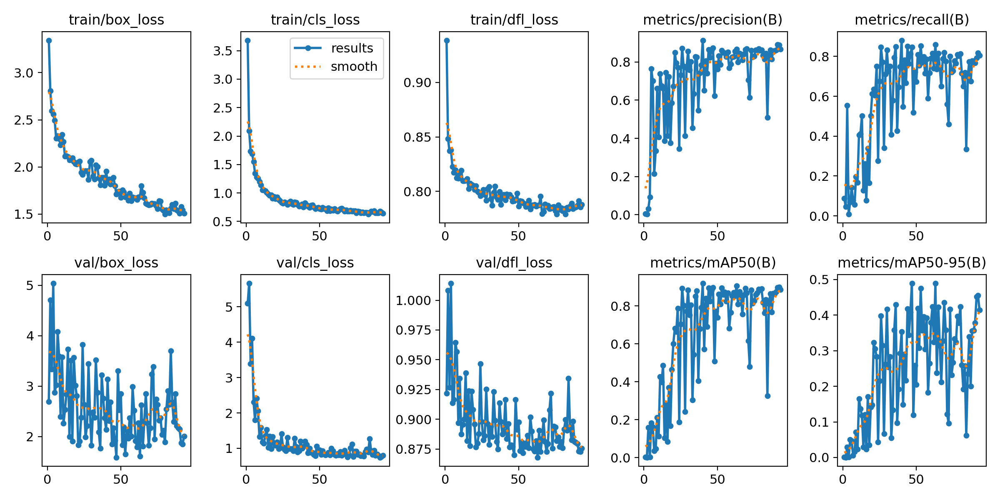


2️⃣ Confusion Matrix:


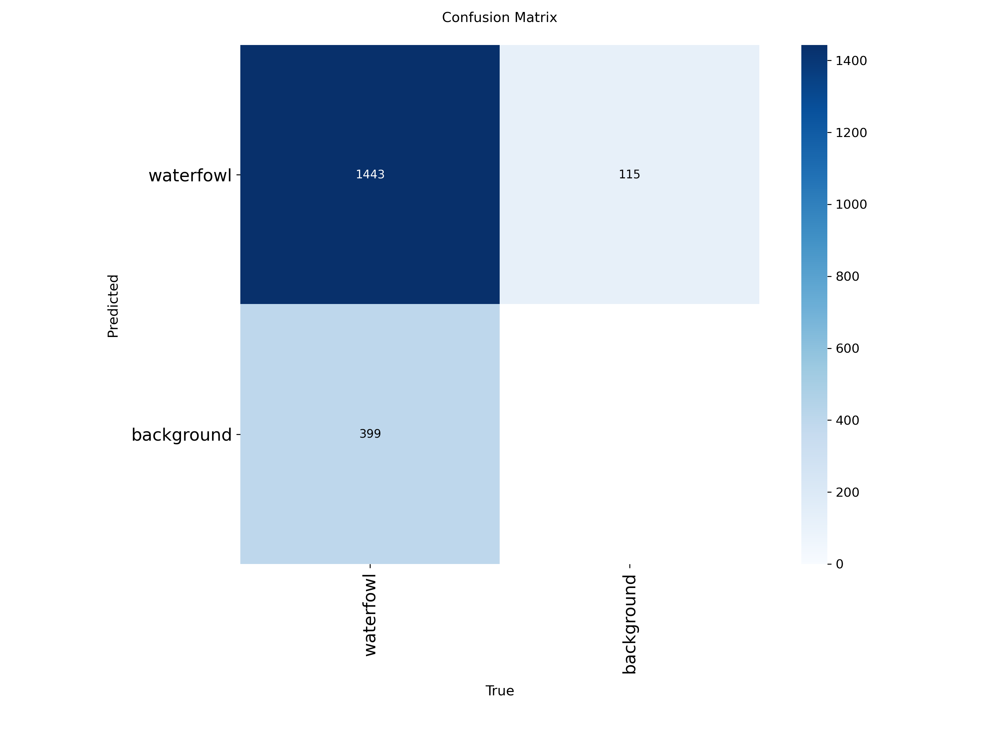


3️⃣ Sample Training Batch with Predictions:


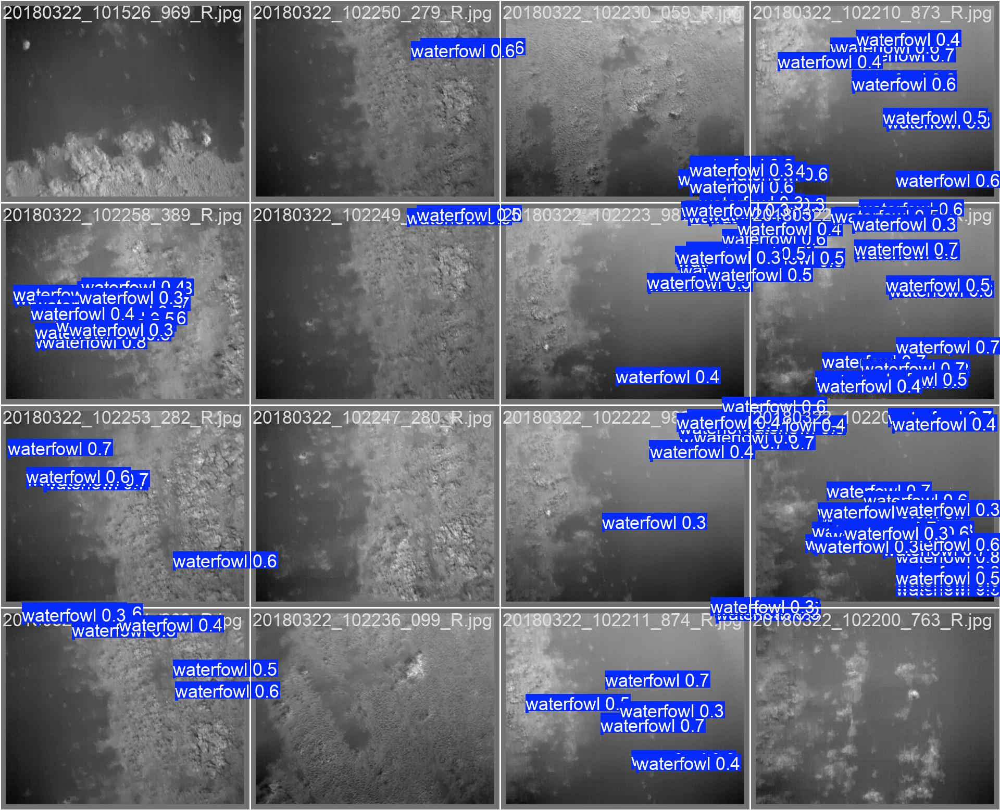

In [17]:
from IPython.display import Image, display

thermal_results_dir = f'runs/detect/{THERMAL_RUN_NAME}2'

print("📈 Training Results Visualization:\n")

# Training curves
print("1️⃣ Training Curves (Loss and Metrics):")
display(Image(filename=f'{thermal_results_dir}/results.png', width=1000))

print("\n2️⃣ Confusion Matrix:")
display(Image(filename=f'{thermal_results_dir}/confusion_matrix.png', width=600))

print("\n3️⃣ Sample Training Batch with Predictions:")
display(Image(filename=f'{thermal_results_dir}/val_batch0_pred.jpg', width=1000))

---
### 3.3 Thermal Model Evaluation <a id="thermal-eval"></a>

Now let's evaluate our thermal-only baseline on the test set.

In [18]:
# Load best thermal model
best_thermal_model_path = f'runs/detect/{THERMAL_RUN_NAME}2/weights/best.pt'
print(f"Loading best thermal model from: {best_thermal_model_path}\n")

thermal_model = YOLO(best_thermal_model_path)

# Evaluate on test set
print("🔍 Evaluating thermal-only model on test set...\n")

thermal_metrics = thermal_model.val(
    data=os.path.abspath('thermal_data.yaml'),
    split='test',
    batch=16,
    conf=0.25,  # Confidence threshold
    iou=0.5,    # IoU threshold for NMS
    max_det=300,  # Max detections per image
    plots=True
)

print("\n" + "="*60)
print("📊 THERMAL-ONLY MODEL - TEST SET RESULTS")
print("="*60)
print(f"mAP50-95:  {thermal_metrics.box.map:.4f}    (Mean AP across IoU 0.5-0.95)")
print(f"mAP50:      {thermal_metrics.box.map50:.4f}    (Mean AP at IoU=0.5)")
print(f"mAP75:      {thermal_metrics.box.map75:.4f}    (Mean AP at IoU=0.75)")
print(f"Precision: {thermal_metrics.box.mp:.4f}    (What % of detections are correct)")
print(f"Recall:     {thermal_metrics.box.mr:.4f}    (What % of birds are detected)")
print("="*60)

# Store results for later comparison
thermal_test_results = {
    'mAP50-95': thermal_metrics.box.map,
    'mAP50': thermal_metrics.box.map50,
    'mAP75': thermal_metrics.box.map75,
    'Precision': thermal_metrics.box.mp,
    'Recall': thermal_metrics.box.mr
}

Loading best thermal model from: runs/detect/thermal_baseline_run2/weights/best.pt

🔍 Evaluating thermal-only model on test set...

Ultralytics 8.3.223 🚀 Python-3.13.2 torch-2.6.0 CPU (Apple M2)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 266.4±25.3 MB/s, size: 100.0 KB)
val: Scanning /Users/user/py/waterfowl_project/raw_data/yolo_dataset_thermal_only/labels/test.cache... 55 images, 19 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 55/55 274.6Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 0.5it/s 8.3s3.6ss
                   all         55        940      0.926      0.796      0.865      0.504
Speed: 1.3ms preprocess, 132.8ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to /Users/user/py/waterfowl_project/raw_data/runs/detect/val

📊 THERMAL-ONLY MODEL - TEST SET RESULTS
mAP50-95:  0.5037    (Mean AP across IoU 0

---
### 3.4 Thermal Model Analysis <a id="thermal-analysis"></a>

Let's analyze the performance and identify limitations.

#### Visualize Thermal Model Predictions

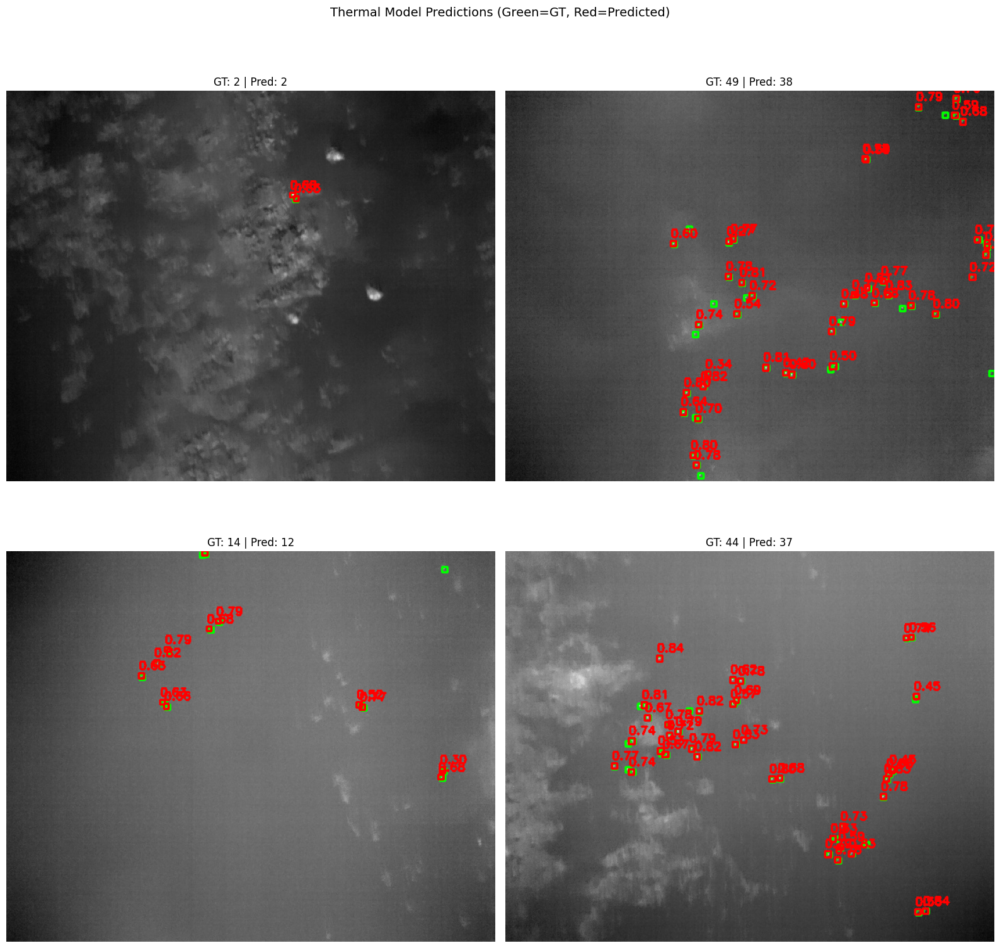

💡 Green boxes = Ground truth | Red boxes = Model predictions


In [19]:
# Helper function to load ground truth
def load_yolo_labels(label_path, img_shape):
    """Load YOLO format labels and convert to pixel coordinates."""
    boxes = []
    if not os.path.exists(label_path):
        return boxes
    
    h, w = img_shape[:2]
    with open(label_path, 'r') as f:
        for line in f.readlines():
            parts = line.strip().split()
            if len(parts) == 5:
                _, x_c, y_c, w_n, h_n = map(float, parts)
                
                # Convert to pixel coordinates
                w_px = w_n * w
                h_px = h_n * h
                x1 = int((x_c * w) - (w_px / 2))
                y1 = int((y_c * h) - (h_px / 2))
                x2 = int(x1 + w_px)
                y2 = int(y1 + h_px)
                boxes.append((x1, y1, x2, y2))
    
    return boxes

# Visualize some predictions
test_img_dir = f'{THERMAL_YOLO_DIR}/images/test'
test_label_dir = f'{THERMAL_YOLO_DIR}/labels/test'
test_images = glob.glob(f'{test_img_dir}/*.jpg')

# Find images with ground truth
positive_test_images = []
for img_path in test_images:
    label_path = img_path.replace('images', 'labels').replace('.jpg', '.txt')
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            if len(f.readlines()) > 0:
                positive_test_images.append(img_path)

# Sample 4 images
samples = random.sample(positive_test_images, min(4, len(positive_test_images)))

fig, axes = plt.subplots(2, 2, figsize=(16, 16))
axes = axes.flatten()

for idx, img_path in enumerate(samples):
    # Load image
    img = cv2.imread(img_path)
    img_display = img.copy()
    
    # Get ground truth
    label_path = img_path.replace('images', 'labels').replace('.jpg', '.txt')
    gt_boxes = load_yolo_labels(label_path, img.shape)
    
    # Get predictions
    results = thermal_model.predict(img_path, conf=0.25, verbose=False)
    pred_boxes = results[0].boxes.xyxy.cpu().numpy().astype(int)
    pred_confs = results[0].boxes.conf.cpu().numpy()
    
    # Draw ground truth (GREEN)
    for (x1, y1, x2, y2) in gt_boxes:
        cv2.rectangle(img_display, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    # Draw predictions (RED)
    for i, (x1, y1, x2, y2) in enumerate(pred_boxes):
        cv2.rectangle(img_display, (x1, y1), (x2, y2), (0, 0, 255), 2)
        cv2.putText(img_display, f'{pred_confs[i]:.2f}', (x1, y1-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
    
    axes[idx].imshow(cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB))
    axes[idx].set_title(f'GT: {len(gt_boxes)} | Pred: {len(pred_boxes)}', fontsize=12)
    axes[idx].axis('off')

plt.suptitle('Thermal Model Predictions (Green=GT, Red=Predicted)', fontsize=14, y=0.995)
plt.tight_layout()
plt.show()

print("💡 Green boxes = Ground truth | Red boxes = Model predictions")

#### Analyze Thermal Model Strengths and Weaknesses

In [20]:
print("📊 THERMAL-ONLY MODEL ANALYSIS\n")
print("="*60)

print("\n✅ STRENGTHS:")
print("    1. Strong thermal contrast helps detect birds")
print("    2. Works in various lighting conditions")
print("    3. Simple single-modality pipeline")
print("    4. Fast inference (YOLOv8n is lightweight)")

print("\n❌ LIMITATIONS OBSERVED:")
print("    1. Low Resolution Issue:")
print("       • Thermal images are only 512×640 pixels")
print("       • Small birds (7×7 pixels) are challenging to detect")
print("       • Limited spatial detail for precise localization")

print("\n    2. Limited Visual Information:")
print("       • Single channel (grayscale) lacks rich features")
print("       • No texture or color information")
print("       • Difficult to distinguish birds from other warm objects")

print("\n    3. Detection Challenges:")
print("       • False positives from warm rocks, debris, reflections")
print("       • Missed detections for distant/small birds")
print("       • Difficulty with overlapping birds")

print("\n    4. Dataset Constraints:")
print("       • Limited training samples (~380 positive images)")
print("       • All bounding boxes same size (7×7) - no scale variation")
print("       • Model may struggle with birds at different distances")

print("\n" + "="*60)
print("\n💡 KEY INSIGHT:")
print("    While thermal imagery provides good contrast, the low resolution")
print("    and lack of visual detail limit detection performance.")
print("\n    🎯 PROPOSED SOLUTION: Fuse thermal with high-resolution RGB data")
print("       to combine thermal signatures with visual context!")
print("="*60)

📊 THERMAL-ONLY MODEL ANALYSIS


✅ STRENGTHS:
    1. Strong thermal contrast helps detect birds
    2. Works in various lighting conditions
    3. Simple single-modality pipeline
    4. Fast inference (YOLOv8n is lightweight)

❌ LIMITATIONS OBSERVED:
    1. Low Resolution Issue:
       • Thermal images are only 512×640 pixels
       • Small birds (7×7 pixels) are challenging to detect
       • Limited spatial detail for precise localization

    2. Limited Visual Information:
       • Single channel (grayscale) lacks rich features
       • No texture or color information
       • Difficult to distinguish birds from other warm objects

    3. Detection Challenges:
       • False positives from warm rocks, debris, reflections
       • Missed detections for distant/small birds
       • Difficulty with overlapping birds

    4. Dataset Constraints:
       • Limited training samples (~380 positive images)
       • All bounding boxes same size (7×7) - no scale variation
       • Model may str

#### Calculate Detection Statistics

In [21]:
# Analyze predictions across test set
total_gt = 0
total_pred = 0
images_with_fp = 0
images_with_fn = 0

for img_path in test_images[:50]:  # Sample 50 images
    label_path = img_path.replace('images', 'labels').replace('.jpg', '.txt')
    
    gt_boxes = load_yolo_labels(label_path, cv2.imread(img_path).shape)
    results = thermal_model.predict(img_path, conf=0.25, verbose=False)
    pred_boxes = results[0].boxes.xyxy.cpu().numpy()
    
    total_gt += len(gt_boxes)
    total_pred += len(pred_boxes)
    
    if len(pred_boxes) > len(gt_boxes):
        images_with_fp += 1
    if len(gt_boxes) > len(pred_boxes) and len(gt_boxes) > 0:
        images_with_fn += 1

print("📈 Detection Statistics (Sample of 50 test images):\n")
print(f"Total ground truth birds: {total_gt}")
print(f"Total predicted birds: {total_pred}")
print(f"Detection rate: {(total_pred/total_gt*100) if total_gt > 0 else 0:.1f}%")
print(f"\nImages with false positives: {images_with_fp}")
print(f"Images with missed detections: {images_with_fn}")

📈 Detection Statistics (Sample of 50 test images):

Total ground truth birds: 895
Total predicted birds: 789
Detection rate: 88.2%

Images with false positives: 5
Images with missed detections: 22


---
---
# PART 2: RGB-THERMAL FUSION (HYPOTHETICAL IMPROVEMENT)
---
---

## 4. Part 2: RGB-Thermal Fusion <a id="part2"></a>

### 4.1 Motivation for Fusion <a id="fusion-motivation"></a>

Based on our thermal-only results, we identified key limitations:
- ❌ Low resolution (512×640)
- ❌ Limited visual features (single channel)
- ❌ Difficulty with small objects (7×7 pixels)

### The Fusion Strategy

**Why Combine RGB and Thermal?**

| Modality | Advantages | Disadvantages |
|----------|-----------|---------------|
| **Thermal** | • Heat signatures<br>• Weather independent<br>• Works day/night | • Low resolution<br>• No texture/color<br>• False positives |
| **RGB** | • High resolution (3000×4000)<br>• Rich visual features<br>• Texture & color info | • Lighting dependent<br>• Camouflage issues<br>• Poor in low light |
| **Fusion** | ✅ **Best of both worlds!** | Coordinate alignment needed |

### Early Fusion Approach

We implement **early fusion** at the input level:

```
Standard RGB:    [R, G, B] channels
Our Fusion:      [R, G, Thermal] channels
                           ↑
                Replace Blue with Thermal!
```

**Benefits**:
- ✅ Leverage pre-trained RGB models (no architecture changes)
- ✅ Single inference pass (efficient)
- ✅ Model learns to integrate both modalities
- ✅ Higher resolution (3000×4000 from RGB)

**Critical Challenge**: Resolution Mismatch
- Thermal: 512×640 pixels
- RGB: 3000×4000 pixels
- **Solution**: Resize thermal to RGB resolution + scale bounding box coordinates

### Visualize the Fusion Concept

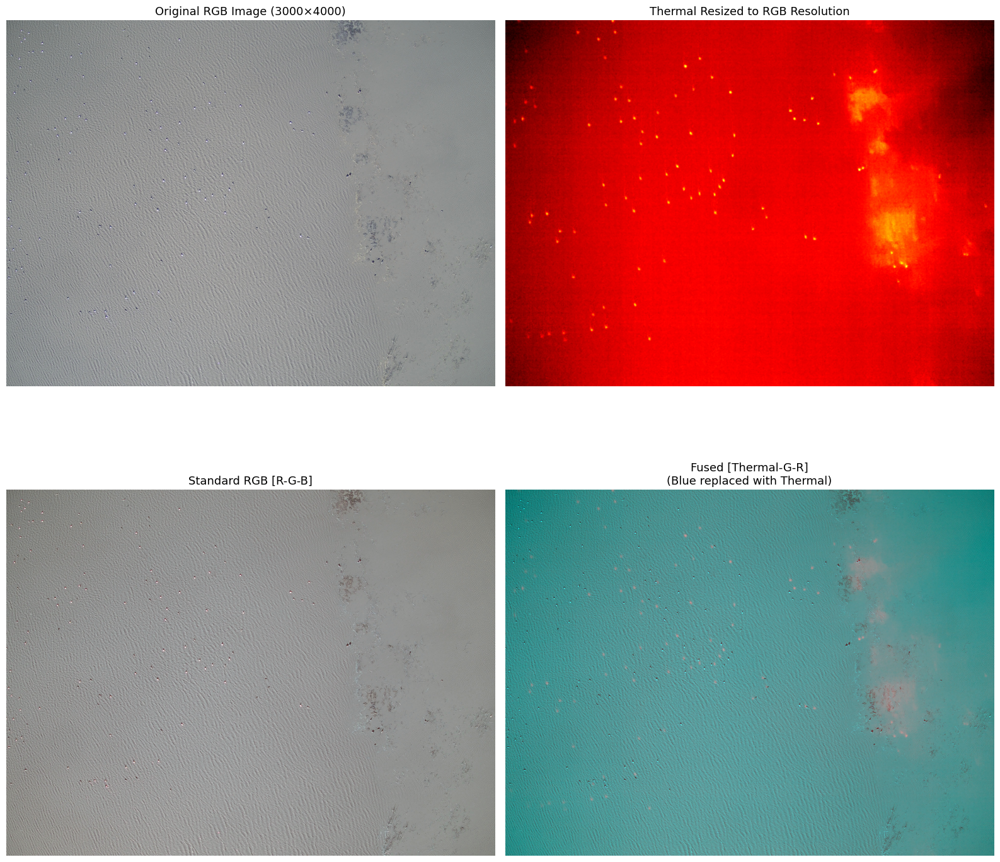

💡 Notice:
    • Fused image has a blue-ish tint from thermal channel
    • Warm objects (birds) appear as blue/cyan hotspots
    • Maintains visual context from green and red channels
    • Resolution is 3000×4000 (from RGB), not 512×640 (from thermal)!


In [22]:
# Demonstrate fusion process
sample_file = pos_thermal_images[5]  # Pick a sample
sample_base = os.path.splitext(sample_file)[0]

# Load images
thermal_img = cv2.imread(os.path.join(POSITIVE_IMG_DIR, sample_file), cv2.IMREAD_GRAYSCALE)
rgb_img = cv2.imread(os.path.join(RGB_DIR, sample_base + '_visual.jpg'))
rgb_img_display = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)

# Resize thermal to match RGB
thermal_resized = cv2.resize(thermal_img, (rgb_img.shape[1], rgb_img.shape[0]))

# Create fusion
r_channel = rgb_img[:, :, 2]
g_channel = rgb_img[:, :, 1]
b_channel = rgb_img[:, :, 0]  # Original blue (will be replaced)
t_channel = thermal_resized

# Standard RGB
rgb_standard = cv2.merge([r_channel, g_channel, b_channel])

# Our fusion: [Thermal, G, R]
fused = cv2.merge([r_channel, g_channel, t_channel])

# Visualize
fig, axes = plt.subplots(2, 2, figsize=(16, 16))

axes[0, 0].imshow(rgb_img_display)
axes[0, 0].set_title('Original RGB Image (3000×4000)', fontsize=13)
axes[0, 0].axis('off')

axes[0, 1].imshow(thermal_resized, cmap='hot')
axes[0, 1].set_title('Thermal Resized to RGB Resolution', fontsize=13)
axes[0, 1].axis('off')

axes[1, 0].imshow(cv2.cvtColor(rgb_standard, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title('Standard RGB [R-G-B]', fontsize=13)
axes[1, 0].axis('off')

axes[1, 1].imshow(cv2.cvtColor(fused, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title('Fused [Thermal-G-R]\n(Blue replaced with Thermal)', fontsize=13)
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

print("💡 Notice:")
print("    • Fused image has a blue-ish tint from thermal channel")
print("    • Warm objects (birds) appear as blue/cyan hotspots")
print("    • Maintains visual context from green and red channels")
print("    • Resolution is 3000×4000 (from RGB), not 512×640 (from thermal)!")

---
### 4.2 Fusion Data Preparation <a id="fusion-prep"></a>

This is the most critical part! We must:
1. Create [R-G-Thermal] fused images
2. **Scale bounding box coordinates** from thermal space to RGB space
3. Convert to YOLO format

In [23]:
# Configuration for fusion dataset
FUSION_YOLO_DIR = 'yolo_dataset_fused'

# Use same split as thermal (for fair comparison)
# We already have thermal_splits dictionary

print("⚙️ Fusion Dataset Configuration:")
print(f"Output directory: {FUSION_YOLO_DIR}")
print(f"Using same train/val/test split as thermal model")
print(f"Image resolution: 3000×4000 (from RGB)")

⚙️ Fusion Dataset Configuration:
Output directory: yolo_dataset_fused
Using same train/val/test split as thermal model
Image resolution: 3000×4000 (from RGB)


#### Create Directory Structure

In [24]:
# Create directories
for split in ['train', 'val', 'test']:
    os.makedirs(os.path.join(FUSION_YOLO_DIR, 'images', split), exist_ok=True)
    os.makedirs(os.path.join(FUSION_YOLO_DIR, 'labels', split), exist_ok=True)

print("✅ Fusion dataset directory structure created")

✅ Fusion dataset directory structure created


#### Build RGB Lookup Map

In [25]:
# Build mapping from thermal filename to RGB filename
print("Building RGB lookup map...")
rgb_lookup = {}

for rgb_filename in os.listdir(RGB_DIR):
    if rgb_filename.endswith(('.jpg', '.jpeg', '.png')):
        # Thermal: 20180322_101536_979_R.tif
        # RGB:     20180322_101536_979_R_visual.jpg
        key = rgb_filename.replace('_visual.jpg', '').replace('_visual.png', '')
        rgb_lookup[key] = os.path.join(RGB_DIR, rgb_filename)

print(f"✅ Built RGB lookup map with {len(rgb_lookup)} files")

Building RGB lookup map...
✅ Built RGB lookup map with 663 files


#### Critical: Coordinate Scaling Explanation

**🚨 THE KEY CHALLENGE: Coordinate Transformation**

Bounding boxes are annotated in thermal image coordinates (512×640), but our fused images are in RGB resolution (3000×4000).

**Example calculation:**
```
Thermal image:  512 height × 640 width
RGB image:      3000 height × 4000 width

Scale factors:
  x_scale = 4000 / 640 = 6.25
  y_scale = 3000 / 512 ≈ 5.86

Original thermal box: (x=100, y=50, w=7, h=7)
Scaled RGB box:       (x=625, y=293, w=44, h=41)
```

If we don't scale coordinates correctly, boxes will be in the wrong locations!

In [26]:
# Demonstrate the scaling issue
print("📐 Coordinate Scaling Visualization\n")

# Sample dimensions
thermal_h, thermal_w = 512, 640
rgb_h, rgb_w = 3000, 4000

x_scale = rgb_w / thermal_w
y_scale = rgb_h / thermal_h

print(f"Thermal dimensions: {thermal_w}×{thermal_h}")
print(f"RGB dimensions:     {rgb_w}×{rgb_h}")
print(f"\nScale factors:")
print(f"  X-axis: {x_scale:.2f}×")
print(f"  Y-axis: {y_scale:.2f}×")

print(f"\nExample box transformation:")
print(f"  Thermal box:  (x=100, y=50, w=7, h=7)")
print(f"  Scaled box:   (x={100*x_scale:.0f}, y={50*y_scale:.0f}, w={7*x_scale:.0f}, h={7*y_scale:.0f})")
print(f"\n⚠️  If not scaled, box would be tiny (7×7) on a 4000×3000 image!")

📐 Coordinate Scaling Visualization

Thermal dimensions: 640×512
RGB dimensions:     4000×3000

Scale factors:
  X-axis: 6.25×
  Y-axis: 5.86×

Example box transformation:
  Thermal box:  (x=100, y=50, w=7, h=7)
  Scaled box:   (x=625, y=293, w=44, h=41)

⚠️  If not scaled, box would be tiny (7×7) on a 4000×3000 image!


#### Fusion Processing Function

In [27]:
def process_fusion_images(file_list, split_name, annotations_df):
    """
    Process images for RGB-Thermal fusion:
    
    Steps:
    1. Load RGB and thermal images
    2. Calculate scale factors (RGB_size / thermal_size)
    3. Resize thermal to match RGB dimensions
    4. Create fused image: [Thermal, Green, Red]
    5. Scale bounding box coordinates to RGB space
    6. Convert to YOLO format and save
    """
    img_output_dir = os.path.join(FUSION_YOLO_DIR, 'images', split_name)
    label_output_dir = os.path.join(FUSION_YOLO_DIR, 'labels', split_name)
    
    skipped = 0
    processed = 0
    
    for filename in tqdm(file_list, desc=f"Processing {split_name}"):
        # Determine if positive or negative
        is_positive = filename in pos_thermal_images
        
        # Get thermal image path
        if is_positive:
            thermal_path = os.path.join(POSITIVE_IMG_DIR, filename)
        else:
            thermal_path = os.path.join(NEGATIVE_IMG_DIR, filename)
        
        # Get corresponding RGB image path
        base_name = os.path.splitext(filename)[0]
        if base_name not in rgb_lookup:
            skipped += 1
            continue
        rgb_path = rgb_lookup[base_name]
        
        # Load images
        img_thermal = cv2.imread(thermal_path, cv2.IMREAD_GRAYSCALE)
        img_rgb = cv2.imread(rgb_path)
        
        if img_thermal is None or img_rgb is None:
            skipped += 1
            continue
        
        # Get dimensions
        thermal_h, thermal_w = img_thermal.shape
        rgb_h, rgb_w = img_rgb.shape[:2]
        
        # Calculate scale factors
        x_scale = rgb_w / thermal_w
        y_scale = rgb_h / thermal_h
        
        # Resize thermal to RGB dimensions
        thermal_resized = cv2.resize(img_thermal, (rgb_w, rgb_h))
        
        # Create fused image: [Thermal, Green, Red]
        r_channel = img_rgb[:, :, 2]
        g_channel = img_rgb[:, :, 1]
        t_channel = thermal_resized
        fused_image = cv2.merge([t_channel, g_channel, r_channel])
        
        # Save fused image
        output_filename = os.path.splitext(filename)[0] + '.jpg'
        output_img_path = os.path.join(img_output_dir, output_filename)
        cv2.imwrite(output_img_path, fused_image)
        
        # Process labels
        label_filename = os.path.splitext(filename)[0] + '.txt'
        output_label_path = os.path.join(label_output_dir, label_filename)
        
        label_lines = []
        
        if is_positive:
            # Get bounding boxes for this image
            boxes_df = annotations_df[annotations_df['imageFilename'] == filename]
            
            for _, row in boxes_df.iterrows():
                # Original thermal coordinates
                x_min_thermal = row['x(column)']
                y_min_thermal = row['y(row)']
                w_thermal = row['width']
                h_thermal = row['height']
                class_id = 0  # waterfowl
                
                # Scale to RGB dimensions
                x_min_scaled = x_min_thermal * x_scale
                y_min_scaled = y_min_thermal * y_scale
                w_scaled = w_thermal * x_scale
                h_scaled = h_thermal * y_scale
                
                # Sanity check
                if w_scaled <= 0 or h_scaled <= 0:
                    continue
                
                # Clip to image bounds
                x_max_scaled = min(rgb_w, x_min_scaled + w_scaled)
                y_max_scaled = min(rgb_h, y_min_scaled + h_scaled)
                x_min_scaled = max(0, x_min_scaled)
                y_min_scaled = max(0, y_min_scaled)
                
                w_clipped = x_max_scaled - x_min_scaled
                h_clipped = y_max_scaled - y_min_scaled
                
                if w_clipped <= 0 or h_clipped <= 0:
                    continue
                
                # Convert to YOLO format (normalized coordinates)
                x_center = (x_min_scaled + w_clipped / 2) / rgb_w
                y_center = (y_min_scaled + h_clipped / 2) / rgb_h
                w_norm = w_clipped / rgb_w
                h_norm = h_clipped / rgb_h
                
                label_lines.append(f"{class_id} {x_center} {y_center} {w_norm} {h_norm}")
        
        # Skip if positive image has no valid boxes
        if is_positive and not label_lines:
            os.remove(output_img_path)
            skipped += 1
            continue
        
        # Write label file
        with open(output_label_path, 'w') as f:
            f.write('\n'.join(label_lines))
        
        processed += 1
    
    return processed, skipped

print("✅ Fusion processing function defined")

✅ Fusion processing function defined


#### Execute Fusion Data Processing

In [28]:
print("🔄 Starting fusion dataset preparation...\n")

total_processed = 0
total_skipped = 0

for split_name, file_list in thermal_splits.items():
    processed, skipped = process_fusion_images(file_list, split_name, df_annotations)
    total_processed += processed
    total_skipped += skipped

print(f"\n✅ Fusion dataset preparation complete!")
print(f"    Processed: {total_processed} images")
print(f"    Skipped: {total_skipped} images")

🔄 Starting fusion dataset preparation...



Processing test: 100%|██████████████████████████| 55/55 [00:06<00:00,  9.03it/s]


✅ Fusion dataset preparation complete!
    Processed: 542 images
    Skipped: 0 images


#### Verify Fusion Dataset

In [29]:
# Verify files
print("🔍 Verifying fusion dataset...\n")

for split in ['train', 'val', 'test']:
    img_dir = os.path.join(FUSION_YOLO_DIR, 'images', split)
    label_dir = os.path.join(FUSION_YOLO_DIR, 'labels', split)
    
    n_images = len(os.listdir(img_dir))
    n_labels = len(os.listdir(label_dir))
    
    print(f"{split.upper():<6}: {n_images} images, {n_labels} labels")

# Check image dimensions
print("\n📐 Sample Fused Image Dimensions:")
sample_imgs = glob.glob(f'{FUSION_YOLO_DIR}/images/train/*.jpg')[:3]
for img_path in sample_imgs:
    img = cv2.imread(img_path)
    print(f"  {os.path.basename(img_path)}: {img.shape} (H×W×C)")

print("\n✅ All fused images are 3000×4000 (high resolution!)")

🔍 Verifying fusion dataset...

TRAIN : 378 images, 378 labels
VAL   : 109 images, 109 labels
TEST  : 55 images, 55 labels

📐 Sample Fused Image Dimensions:
  20180322_102233_062_R.jpg: (3000, 4000, 3) (H×W×C)
  20180322_102459_579_R.jpg: (3000, 4000, 3) (H×W×C)
  20180322_101651_689_R.jpg: (3000, 4000, 3) (H×W×C)

✅ All fused images are 3000×4000 (high resolution!)


#### Visualize Fusion with Scaled Bounding Boxes

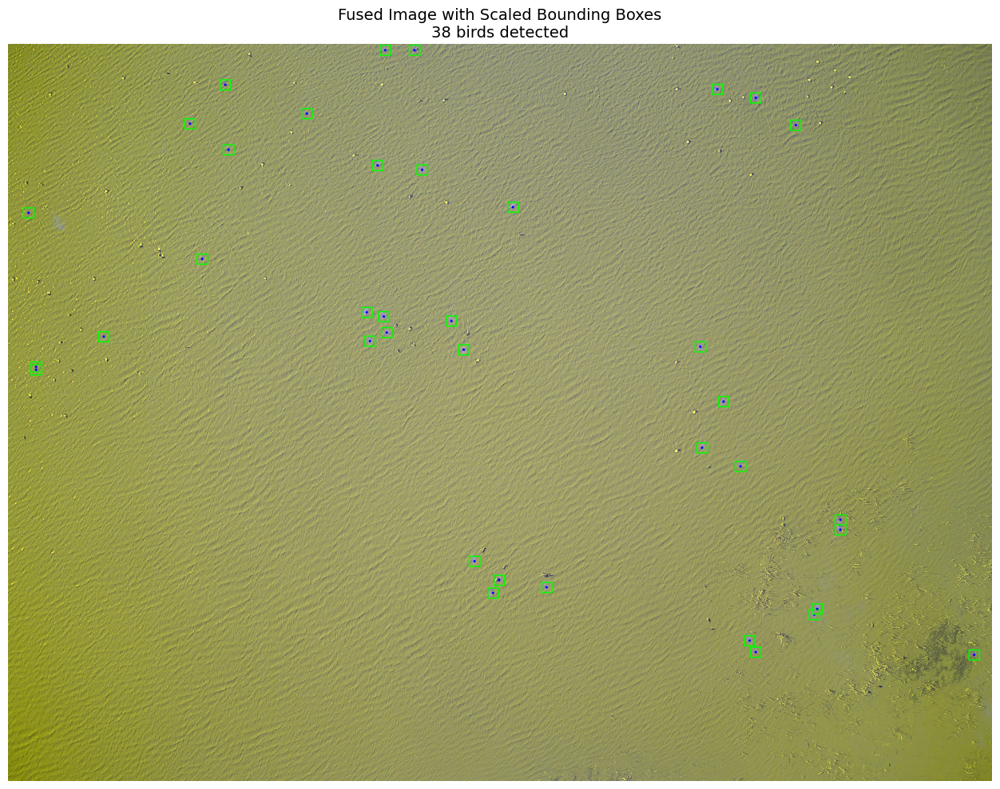

💡 Image resolution: 4000×3000
    Number of annotated birds: 38
    Average box size: 43.0×41.0 pixels
    (Original 7×7 thermal → ~43×41 RGB)


In [32]:
# Show a fused image with properly scaled bounding boxes
sample_fused_img = glob.glob(f'{FUSION_YOLO_DIR}/images/train/*.jpg')[13]
sample_fused_label = sample_fused_img.replace('images', 'labels').replace('.jpg', '.txt')

# Load image
img_fused = cv2.imread(sample_fused_img)
img_display = img_fused.copy()

# Load and draw boxes
boxes = load_yolo_labels(sample_fused_label, img_fused.shape)
for (x1, y1, x2, y2) in boxes:
    cv2.rectangle(img_display, (x1, y1), (x2, y2), (0, 255, 0), 3)
    # Draw box center
    cx, cy = (x1+x2)//2, (y1+y2)//2
    cv2.circle(img_display, (cx, cy), 5, (255, 0, 0), -1)

# Display
plt.figure(figsize=(16, 12))
plt.imshow(cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB))
plt.title(f'Fused Image with Scaled Bounding Boxes\n{len(boxes)} birds detected', fontsize=14)
plt.axis('off')
plt.show()

print(f"💡 Image resolution: {img_fused.shape[1]}×{img_fused.shape[0]}")
print(f"    Number of annotated birds: {len(boxes)}")
if len(boxes) > 0:
    avg_w = np.mean([x2-x1 for x1, y1, x2, y2 in boxes])
    avg_h = np.mean([y2-y1 for x1, y1, x2, y2 in boxes])
    print(f"    Average box size: {avg_w:.1f}×{avg_h:.1f} pixels")
    print(f"    (Original 7×7 thermal → ~{avg_w:.0f}×{avg_h:.0f} RGB)")

#### Create YOLO Configuration for Fusion Model

In [33]:
%%writefile fusion_data.yaml

# RGB-Thermal Fusion YOLO configuration
# NOTE: Update 'path' with your absolute path
path: /Users/user/py/waterfowl_project/raw_data/yolo_dataset_fused

# Dataset splits
train: images/train
val: images/val
test: images/test

# Class definitions
names:
  0: waterfowl

# Number of classes
nc: 1

Overwriting fusion_data.yaml


---
### 4.3 Training Fusion Model <a id="fusion-train"></a>

Now we train our improved model with fused RGB-Thermal data.

#### Fusion Training Configuration

In [35]:
# Configuration
FUSION_RUN_NAME = 'fusion_improved'

print("⚙️ Fusion Model Training Configuration:")
print(f"Model: YOLOv8s (Small - more capacity than nano)")
print(f"Run name: {FUSION_RUN_NAME}")
print(f"Input: Fused [R-G-Thermal] images at 3000×4000")
print(f"Training size: 640×640 (resized during training)")
print(f"Epochs: 100 (with early stopping)")
print(f"Batch size: 8 (smaller due to higher resolution)")
print("\n💡 Using YOLOv8s instead of nano for better accuracy")

⚙️ Fusion Model Training Configuration:
Model: YOLOv8s (Small - more capacity than nano)
Run name: fusion_improved
Input: Fused [R-G-Thermal] images at 3000×4000
Training size: 640×640 (resized during training)
Epochs: 100 (with early stopping)
Batch size: 8 (smaller due to higher resolution)

💡 Using YOLOv8s instead of nano for better accuracy


In [37]:
# Load YOLOv8s model
fusion_model = YOLO('yolov8s.pt')

print("🚀 Starting fusion model training...\n")

# Train the fusion model
fusion_results = fusion_model.train(
    # Data configuration
    data=os.path.abspath('fusion_data.yaml'),
    
    # Training duration
    epochs=100,
    patience=40,  # Early stopping
    
    # Image settings
    imgsz=640,    # Training resolution (images will be resized)
    batch=8,      # Smaller batch due to higher input resolution
    
    # Learning rate schedule
    lr0=0.001,    # Lower initial LR for larger model
    lrf=0.01,
    warmup_epochs=5,
    cos_lr=True,
    
    # Data augmentation
    degrees=90.0,     # Random rotation
    fliplr=0.5,       # Horizontal flip
    flipud=0.5,       # Vertical flip (birds can be upside down in aerial view)
    mosaic=1.0,
    close_mosaic=15,  # Disable mosaic last 15 epochs
    
    # Detection settings
    conf=0.25,
    iou=0.5,
    max_det=100,
    
    # Output settings
    name=FUSION_RUN_NAME,
    project='runs/detect',
    exist_ok=False,
    
    # Device and optimization
    device='mps',      # Auto-detect
    workers=8,
    amp=True,       # Mixed precision training
    
    # Monitoring
    val=True,
    plots=True,
    save=True,
    save_period=10
)

print("\n✅ Fusion model training complete!")

🚀 Starting fusion model training...

New https://pypi.org/project/ultralytics/8.3.228 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.223 🚀 Python-3.13.2 torch-2.6.0 MPS (Apple M2)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=15, cls=0.5, compile=False, conf=0.25, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/Users/user/py/waterfowl_project/raw_data/fusion_data.yaml, degrees=90.0, deterministic=True, device=mps, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.5, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=100, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=F

KeyboardInterrupt: 

#### Display Fusion Training Progress

✅ Loaded 50 epochs of training data

✅ Saved YOLO-style plot: runs/detect/fusion_improved4/results.png


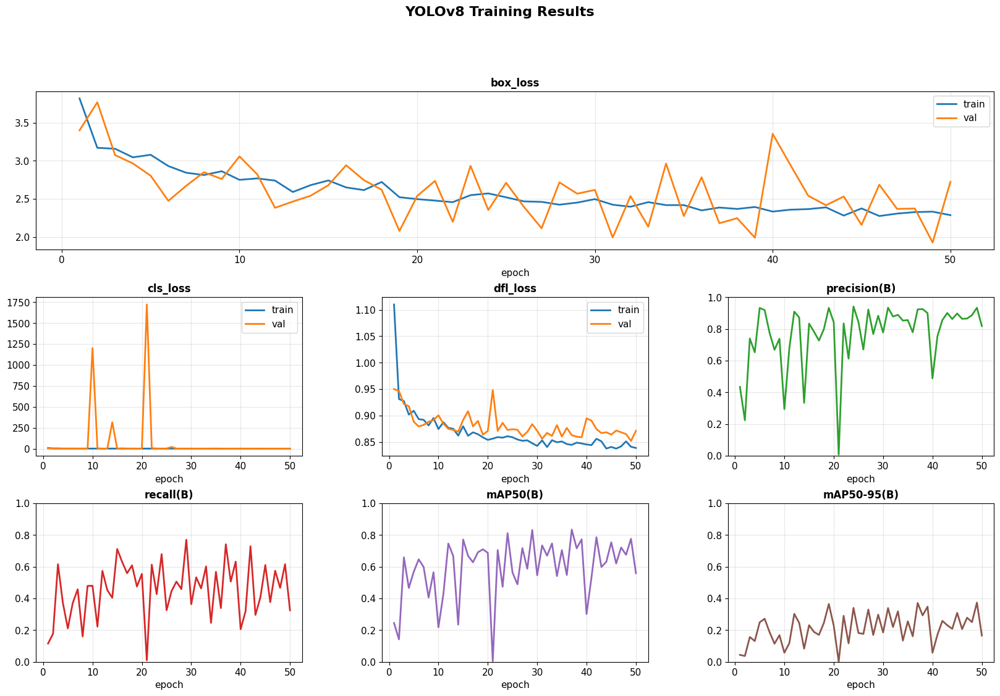


📊 BEST RESULTS

Best mAP50: 0.8344 at epoch 37
Best mAP50-95: 0.3738 at epoch 49


In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

FUSION_RUN_NAME = 'fusion_improved4'
fusion_results_dir = f'runs/detect/{FUSION_RUN_NAME}'

# Read results
df = pd.read_csv(f'{fusion_results_dir}/results.csv')
df.columns = df.columns.str.strip()

print(f"✅ Loaded {len(df)} epochs of training data\n")

# Create YOLO-style results plot
fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# Define subplots
ax1 = fig.add_subplot(gs[0, :])  # Box loss
ax2 = fig.add_subplot(gs[1, 0])  # Objectness loss (cls)
ax3 = fig.add_subplot(gs[1, 1])  # Classification loss (dfl)
ax4 = fig.add_subplot(gs[1, 2])  # Precision
ax5 = fig.add_subplot(gs[2, 0])  # Recall
ax6 = fig.add_subplot(gs[2, 1])  # mAP50
ax7 = fig.add_subplot(gs[2, 2])  # mAP50-95

epochs = df['epoch'].values

# Plot 1: Box Loss (train + val)
ax1.plot(epochs, df['train/box_loss'], label='train', linewidth=2, color='#1f77b4')
ax1.plot(epochs, df['val/box_loss'], label='val', linewidth=2, color='#ff7f0e')
ax1.set_title('box_loss', fontsize=12, fontweight='bold')
ax1.set_xlabel('epoch')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot 2: Class Loss
ax2.plot(epochs, df['train/cls_loss'], label='train', linewidth=2, color='#1f77b4')
ax2.plot(epochs, df['val/cls_loss'], label='val', linewidth=2, color='#ff7f0e')
ax2.set_title('cls_loss', fontsize=12, fontweight='bold')
ax2.set_xlabel('epoch')
ax2.legend()
ax2.grid(True, alpha=0.3)

# Plot 3: DFL Loss
ax3.plot(epochs, df['train/dfl_loss'], label='train', linewidth=2, color='#1f77b4')
ax3.plot(epochs, df['val/dfl_loss'], label='val', linewidth=2, color='#ff7f0e')
ax3.set_title('dfl_loss', fontsize=12, fontweight='bold')
ax3.set_xlabel('epoch')
ax3.legend()
ax3.grid(True, alpha=0.3)

# Plot 4: Precision
ax4.plot(epochs, df['metrics/precision(B)'], linewidth=2, color='#2ca02c')
ax4.set_title('precision(B)', fontsize=12, fontweight='bold')
ax4.set_xlabel('epoch')
ax4.set_ylim([0, 1])
ax4.grid(True, alpha=0.3)

# Plot 5: Recall
ax5.plot(epochs, df['metrics/recall(B)'], linewidth=2, color='#d62728')
ax5.set_title('recall(B)', fontsize=12, fontweight='bold')
ax5.set_xlabel('epoch')
ax5.set_ylim([0, 1])
ax5.grid(True, alpha=0.3)

# Plot 6: mAP50
ax6.plot(epochs, df['metrics/mAP50(B)'], linewidth=2, color='#9467bd')
ax6.set_title('mAP50(B)', fontsize=12, fontweight='bold')
ax6.set_xlabel('epoch')
ax6.set_ylim([0, 1])
ax6.grid(True, alpha=0.3)

# Plot 7: mAP50-95
ax7.plot(epochs, df['metrics/mAP50-95(B)'], linewidth=2, color='#8c564b')
ax7.set_title('mAP50-95(B)', fontsize=12, fontweight='bold')
ax7.set_xlabel('epoch')
ax7.set_ylim([0, 1])
ax7.grid(True, alpha=0.3)

plt.suptitle('YOLOv8 Training Results', fontsize=16, fontweight='bold', y=0.995)

# Save
output_path = f'{fusion_results_dir}/results.png'
plt.savefig(output_path, dpi=200, bbox_inches='tight')
print(f"✅ Saved YOLO-style plot: {output_path}")

plt.show()

# Print best results
print("\n" + "="*60)
print("📊 BEST RESULTS")
print("="*60)
best_map50_idx = df['metrics/mAP50(B)'].idxmax()
best_map50_95_idx = df['metrics/mAP50-95(B)'].idxmax()

print(f"\nBest mAP50: {df.loc[best_map50_idx, 'metrics/mAP50(B)']:.4f} at epoch {int(df.loc[best_map50_idx, 'epoch'])}")
print(f"Best mAP50-95: {df.loc[best_map50_95_idx, 'metrics/mAP50-95(B)']:.4f} at epoch {int(df.loc[best_map50_95_idx, 'epoch'])}")
print("="*60)

📈 Fusion Model Training Results:

1️⃣ Training Curves:


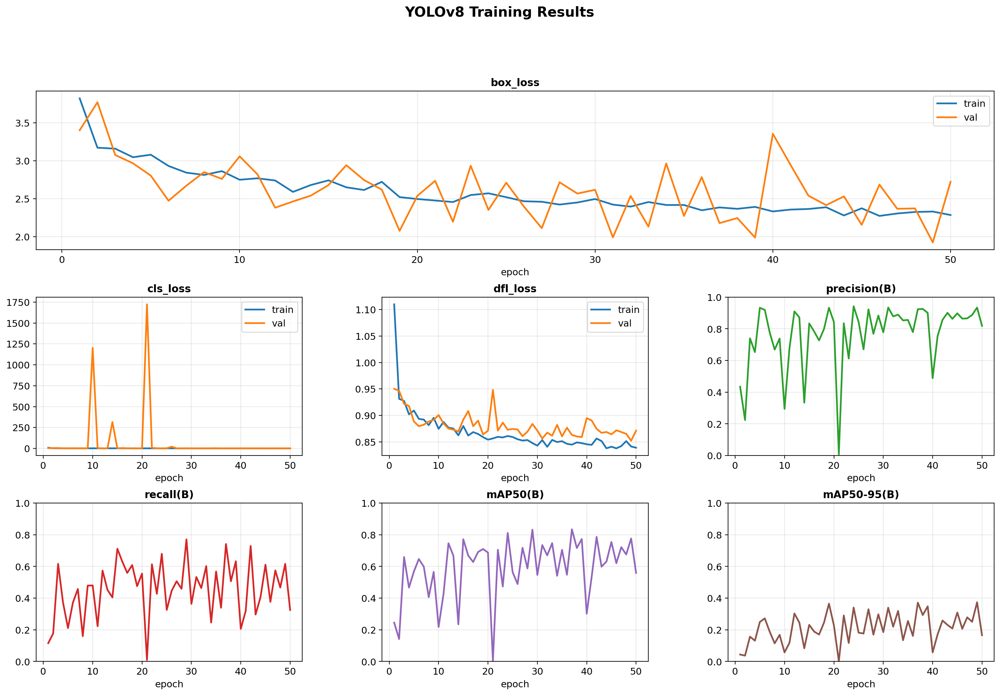


2️⃣ Training Batches:


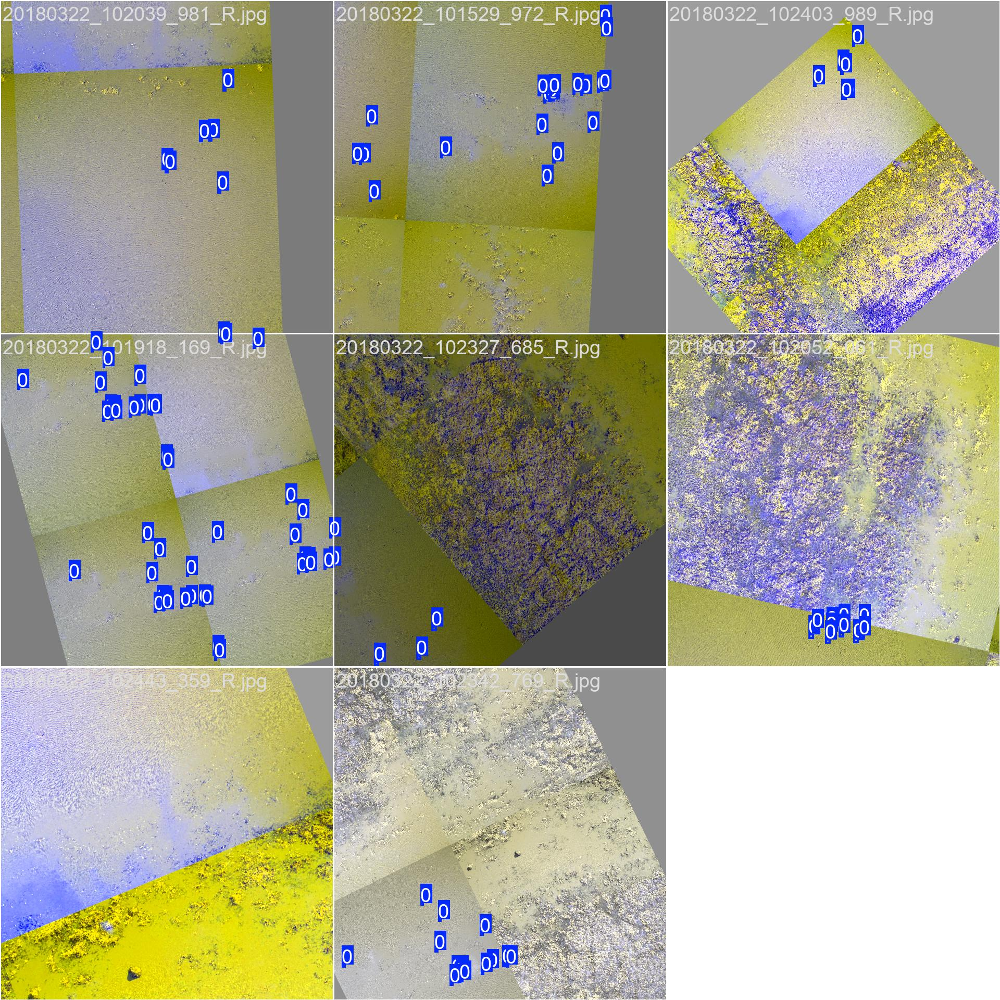


3️⃣ Label Distribution:


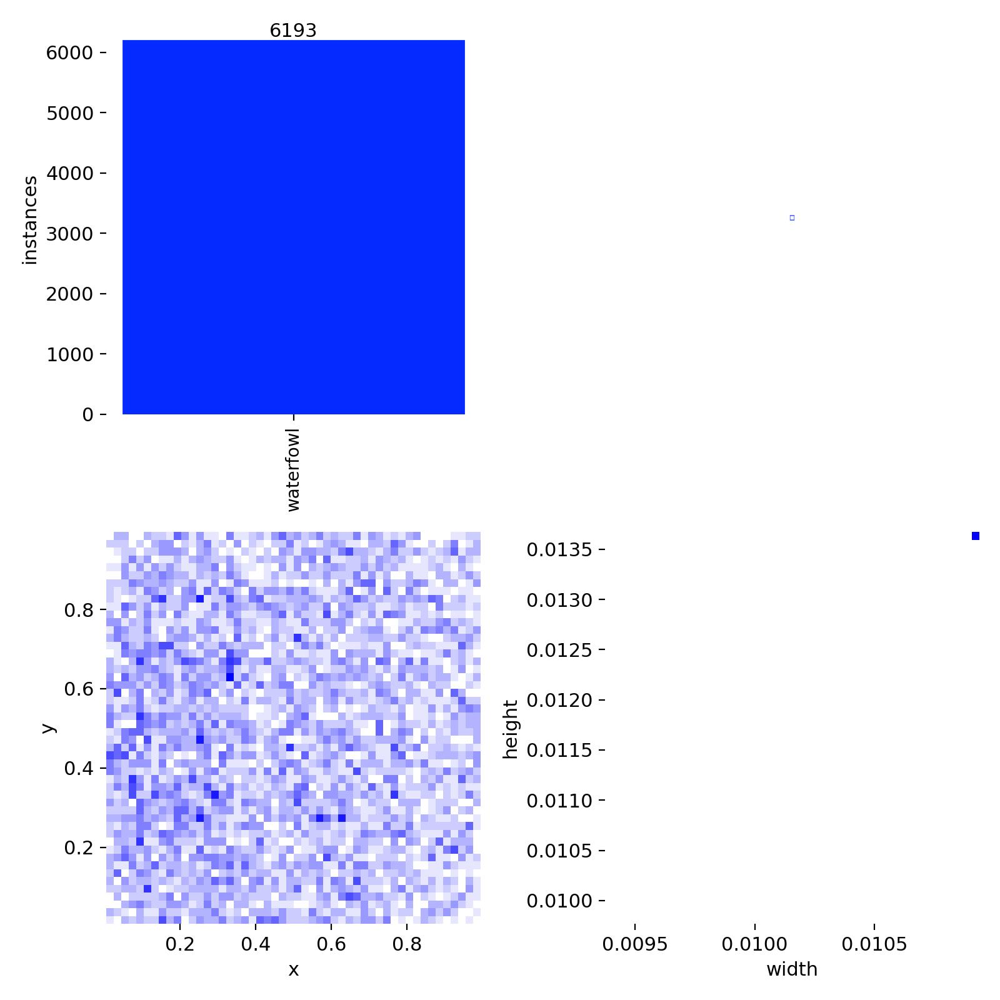

In [56]:
from IPython.display import Image, display

fusion_results_dir = f'runs/detect/{FUSION_RUN_NAME}'

print("📈 Fusion Model Training Results:\n")

print("1️⃣ Training Curves:")
display(Image(filename=f'{fusion_results_dir}/results.png', width=1000))

print("\n2️⃣ Training Batches:")
display(Image(filename=f'{fusion_results_dir}/train_batch0.jpg', width=800))

print("\n3️⃣ Label Distribution:")
display(Image(filename=f'{fusion_results_dir}/labels.jpg', width=800))

---
### 4.4 Fusion Model Evaluation <a id="fusion-eval"></a>

In [58]:
# Load best fusion model
best_fusion_model_path = f'runs/detect/{FUSION_RUN_NAME}/weights/best.pt'
print(f"Loading best fusion model from: {best_fusion_model_path}\n")

fusion_model = YOLO(best_fusion_model_path)

# Evaluate on test set
print("🔍 Evaluating fusion model on test set...\n")

fusion_metrics = fusion_model.val(
    data=os.path.abspath('fusion_data.yaml'),
    split='test',
    batch=8,
    conf=0.25,
    iou=0.5,
    max_det=300,
    plots=True
)

print("\n" + "="*60)
print("📊 FUSION MODEL - TEST SET RESULTS")
print("="*60)
print(f"mAP50-95:  {fusion_metrics.box.map:.4f}    (Mean AP across IoU 0.5-0.95)")
print(f"mAP50:      {fusion_metrics.box.map50:.4f}    (Mean AP at IoU=0.5)")
print(f"mAP75:      {fusion_metrics.box.map75:.4f}    (Mean AP at IoU=0.75)")
print(f"Precision: {fusion_metrics.box.mp:.4f}    (What % of detections are correct)")
print(f"Recall:     {fusion_metrics.box.mr:.4f}    (What % of birds are detected)")
print("="*60)

# Store results for comparison
fusion_test_results = {
    'mAP50-95': fusion_metrics.box.map,
    'mAP50': fusion_metrics.box.map50,
    'mAP75': fusion_metrics.box.map75,
    'Precision': fusion_metrics.box.mp,
    'Recall': fusion_metrics.box.mr
}

Loading best fusion model from: runs/detect/fusion_improved4/weights/best.pt

🔍 Evaluating fusion model on test set...

Ultralytics 8.3.223 🚀 Python-3.13.2 torch-2.6.0 CPU (Apple M2)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1388.5±65.1 MB/s, size: 5495.6 KB)
val: Scanning /Users/user/py/waterfowl_project/raw_data/yolo_dataset_fused/labels/test.cache... 55 images, 19 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 55/55 126.2Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 0.7it/s 10.6s.7ss
                   all         55        940      0.918      0.641      0.783      0.358
Speed: 0.5ms preprocess, 119.5ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /Users/user/py/waterfowl_project/raw_data/runs/detect/val2

📊 FUSION MODEL - TEST SET RESULTS
mAP50-95:  0.3577    (Mean AP across IoU 0.5-0.95)
mAP50:     

---
## 5. Comparative Analysis <a id="comparison"></a>

Now let's compare thermal-only vs fusion performance.

### Side-by-Side Metrics Comparison

In [59]:
# Create comparison table
comparison_df = pd.DataFrame({
    'Thermal-Only': thermal_test_results,
    'RGB-Thermal Fusion': fusion_test_results
})

# Calculate improvement
comparison_df['Improvement'] = (
    (comparison_df['RGB-Thermal Fusion'] - comparison_df['Thermal-Only']) / 
    comparison_df['Thermal-Only'] * 100
)

print("\n" + "="*70)
print("📊 MODEL COMPARISON - TEST SET PERFORMANCE")
print("="*70)
print(comparison_df.to_string())
print("="*70)

print("\n💡 Key Observations:")
if fusion_test_results['mAP50'] > thermal_test_results['mAP50']:
    improvement = (fusion_test_results['mAP50'] - thermal_test_results['mAP50']) / thermal_test_results['mAP50'] * 100
    print(f"    ✅ Fusion model improved mAP50 by {improvement:.1f}%")
else:
    print("    ⚠️  Thermal-only performed better on mAP50")

if fusion_test_results['Recall'] > thermal_test_results['Recall']:
    print(f"    ✅ Fusion model detected more birds (higher recall)")
else:
    print(f"    ⚠️  Thermal-only had higher recall")

if fusion_test_results['Precision'] > thermal_test_results['Precision']:
    print(f"    ✅ Fusion model had fewer false positives (higher precision)")
else:
    print(f"    ⚠️  Thermal-only had higher precision")


📊 MODEL COMPARISON - TEST SET PERFORMANCE
           Thermal-Only  RGB-Thermal Fusion  Improvement
mAP50-95       0.503654            0.357736   -28.971913
mAP50          0.865267            0.783265    -9.477128
mAP75          0.515790            0.239539   -53.558734
Precision      0.925743            0.917808    -0.857080
Recall         0.795745            0.641489   -19.385027

💡 Key Observations:
    ⚠️  Thermal-only performed better on mAP50
    ⚠️  Thermal-only had higher recall
    ⚠️  Thermal-only had higher precision


### Visualize Performance Comparison

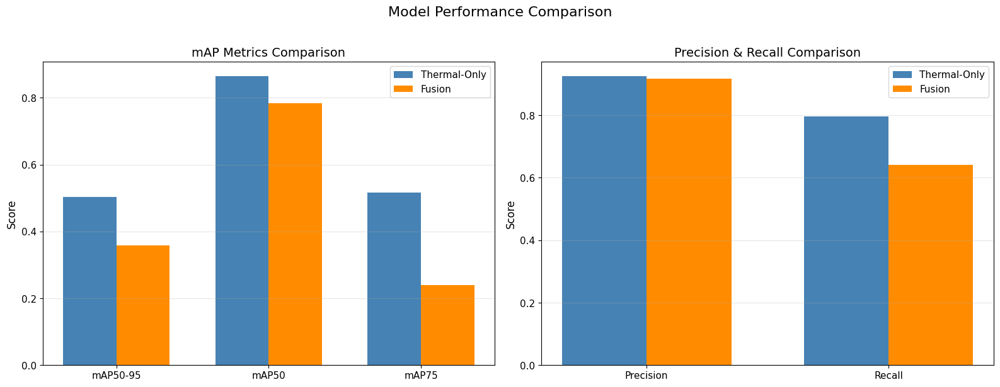

In [60]:
# Bar chart comparison
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# mAP comparison
metrics = ['mAP50-95', 'mAP50', 'mAP75']
thermal_vals = [thermal_test_results[m] for m in metrics]
fusion_vals = [fusion_test_results[m] for m in metrics]

x = np.arange(len(metrics))
width = 0.35

axes[0].bar(x - width/2, thermal_vals, width, label='Thermal-Only', color='steelblue')
axes[0].bar(x + width/2, fusion_vals, width, label='Fusion', color='darkorange')
axes[0].set_ylabel('Score', fontsize=12)
axes[0].set_title('mAP Metrics Comparison', fontsize=14)
axes[0].set_xticks(x)
axes[0].set_xticklabels(metrics)
axes[0].legend()
axes[0].grid(axis='y', alpha=0.3)

# Precision-Recall comparison
metrics2 = ['Precision', 'Recall']
thermal_vals2 = [thermal_test_results[m] for m in metrics2]
fusion_vals2 = [fusion_test_results[m] for m in metrics2]

x2 = np.arange(len(metrics2))

axes[1].bar(x2 - width/2, thermal_vals2, width, label='Thermal-Only', color='steelblue')
axes[1].bar(x2 + width/2, fusion_vals2, width, label='Fusion', color='darkorange')
axes[1].set_ylabel('Score', fontsize=12)
axes[1].set_title('Precision & Recall Comparison', fontsize=14)
axes[1].set_xticks(x2)
axes[1].set_xticklabels(metrics2)
axes[1].legend()
axes[1].grid(axis='y', alpha=0.3)

plt.suptitle('Model Performance Comparison', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()